In [86]:
import skmob

import gpxpy
import gpxpy.gpx

import pandas as pd
import matplotlib.pyplot as plt
from skmob.preprocessing import detection

import pandas as pd
import geopandas as gpd
import movingpandas as mpd
import shapely as shp
import hvplot.pandas 
import matplotlib.pyplot as plt

from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, LineString, Polygon
from datetime import datetime, timedelta
from holoviews import opts

from fiona.crs import from_epsg
import warnings
warnings.filterwarnings('ignore')

plot_defaults = {'linewidth':5, 'capstyle':'round', 'figsize':(9,3), 'legend':True}
opts.defaults(opts.Overlay(active_tools=['wheel_zoom'], frame_width=500, frame_height=400))

mpd.show_versions()

plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False


MovingPandas 0.16.0

SYSTEM INFO
-----------
python     : 3.10.10 | packaged by conda-forge | (main, Mar 24 2023, 20:08:06) [GCC 11.3.0]
executable : /home/jag/anaconda3/envs/llacta-rumbos/bin/python
machine    : Linux-5.19.0-41-generic-x86_64-with-glibc2.35

GEOS, GDAL, PROJ INFO
---------------------
GEOS       : None
GEOS lib   : None
GDAL       : 3.6.4
GDAL data dir: /home/jag/anaconda3/envs/llacta-rumbos/share/gdal
PROJ       : 9.2.0
PROJ data dir: /home/jag/anaconda3/envs/llacta-rumbos/share/proj

PYTHON DEPENDENCIES
-------------------
geopandas  : 0.13.0
pandas     : 2.0.1
fiona      : 1.9.3
numpy      : 1.23.5
shapely    : 2.0.1
rtree      : 1.0.1
pyproj     : 3.5.0
matplotlib : 3.7.1
mapclassify: 2.5.0
geopy      : 2.3.0
holoviews  : 1.15.4
hvplot     : 0.8.3
geoviews   : 1.9.6
stonesoup  : 0.1b12


### Open .GPX file

In [50]:
with open('./data/MF91_PilotoArtefacto_reloj_20230407.gpx', 'r') as gpx_file:
    gpx = gpxpy.parse(gpx_file)

Points count:

In [54]:
len(gpx.tracks[0].segments[0].points)

17876

In [55]:
gpx.tracks[0].segments[0].points[0:10]

[GPXTrackPoint(-2.885413333, -79.052413333, time=datetime.datetime(2023, 4, 7, 6, 54, 11, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885413333, -79.052413333, time=datetime.datetime(2023, 4, 7, 6, 54, 12, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885411667, -79.052413333, time=datetime.datetime(2023, 4, 7, 6, 54, 13, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885413333, -79.052415, time=datetime.datetime(2023, 4, 7, 6, 54, 14, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885411667, -79.052415, time=datetime.datetime(2023, 4, 7, 6, 54, 15, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.88541, -79.052415, time=datetime.datetime(2023, 4, 7, 6, 54, 16, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885408333, -79.052416667, time=datetime.datetime(2023, 4, 7, 6, 54, 17, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885408333, -79.052416667, time=datetime.datetime(2023, 4, 7, 6, 54, 18, tzinfo=SimpleTZ("Z"))),
 GPXTrackPoint(-2.885403333, -79.052421667, time=datetime.datetime(2023, 4, 7, 6, 54, 19, tzinfo=Simp

### Create pandas data frame

In [56]:
route_info = []

for track in gpx.tracks:
    for segment in track.segments:
        for point in segment.points:
            route_info.append({
                'lat': point.latitude,
                'lon': point.longitude,
                'elevation': point.elevation,
                'time': point.time,
                'trajectory_id': "1"
            })

In [57]:
route_df = pd.DataFrame(route_info)
route_df.head()

,lat,lon,elevation,time,trajectory_id
0,-2.885413,-79.052413,None,2023-04-07 06:54:11+00:00,1
1,-2.885413,-79.052413,None,2023-04-07 06:54:12+00:00,1
2,-2.885412,-79.052413,None,2023-04-07 06:54:13+00:00,1
3,-2.885413,-79.052415,None,2023-04-07 06:54:14+00:00,1
4,-2.885412,-79.052415,None,2023-04-07 06:54:15+00:00,1


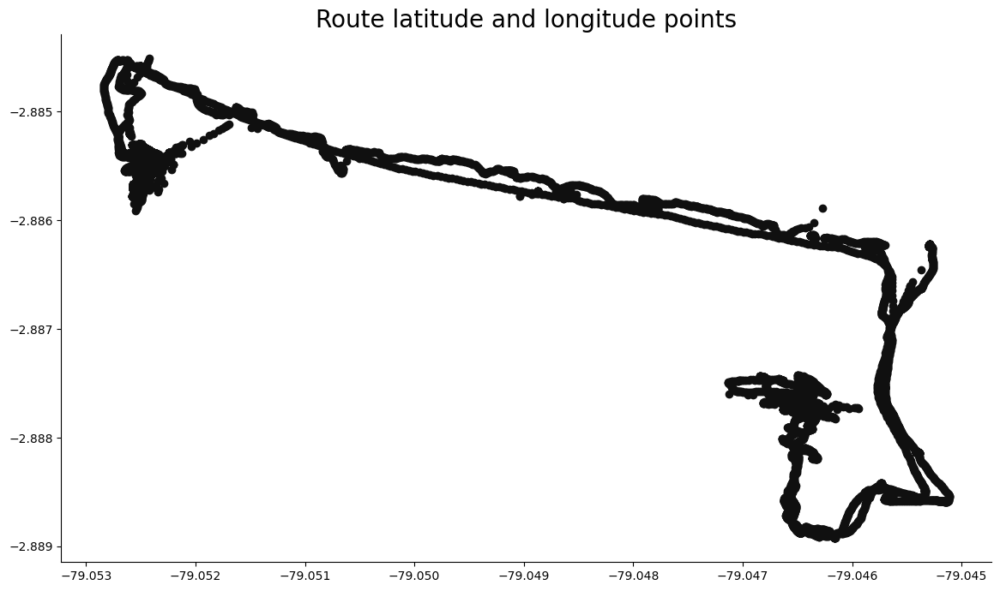

In [58]:
plt.figure(figsize=(14, 8))
plt.scatter(route_df['lon'], route_df['lat'], color='#101010')
plt.title('Route latitude and longitude points', size=20);

### Create GeoPandas data frame

In [87]:
gdf = gpd.GeoDataFrame(
    route_df, geometry=gpd.points_from_xy(route_df.lon, route_df.lat), crs=from_epsg(4326))
print(gdf.head())


        lat        lon elevation                      time trajectory_id   
0 -2.885413 -79.052413      None 2023-04-07 06:54:11+00:00             1  \
1 -2.885413 -79.052413      None 2023-04-07 06:54:12+00:00             1   
2 -2.885412 -79.052413      None 2023-04-07 06:54:13+00:00             1   
3 -2.885413 -79.052415      None 2023-04-07 06:54:14+00:00             1   
4 -2.885412 -79.052415      None 2023-04-07 06:54:15+00:00             1   

                     geometry  
0  POINT (-79.05241 -2.88541)  
1  POINT (-79.05241 -2.88541)  
2  POINT (-79.05241 -2.88541)  
3  POINT (-79.05241 -2.88541)  
4  POINT (-79.05241 -2.88541)  


### Create MovingPandas trejectory

In [88]:
traj_collection = mpd.TrajectoryCollection(gdf, 'trajectory_id', t='time')


In [89]:
original_traj = traj_collection.trajectories[0]
print(original_traj)

Trajectory 1 (2023-04-07 06:54:11 to 2023-04-07 11:52:06) | Size: 17876 | Length: 7739.1m
Bounds: (-79.052841667, -2.888925, -79.045111667, -2.88451)
LINESTRING (-79.052413333 -2.885413333, -79.052413333 -2.885413333, -79.052413333 -2.885411667, -79.


<Axes: >

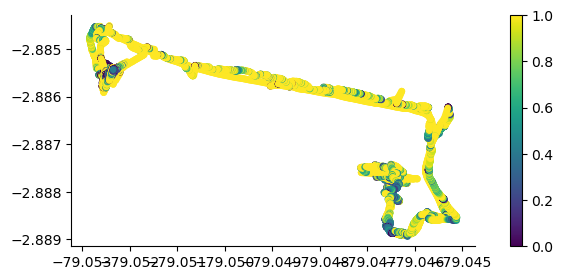

In [90]:
original_traj.plot(column='speed', vmax=1, **plot_defaults)


## Spatial generalization (DouglasPeuckerGeneralizer)
Try different tolerance settings and observe the results in line geometry and therefore also length:



<Axes: >

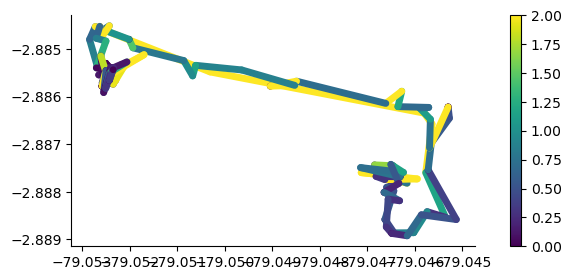

In [91]:
dp_generalized  = mpd.DouglasPeuckerGeneralizer(original_traj).generalize(tolerance=0.0001)
dp_generalized.plot(column='speed', vmax=2, **plot_defaults)


In [92]:
dp_generalized 


Trajectory 1 (2023-04-07 06:54:11 to 2023-04-07 11:52:06) | Size: 158 | Length: 5683.7m
Bounds: (-79.052841667, -2.888925, -79.045121667, -2.88451)
LINESTRING (-79.052413333 -2.885413333, -79.052413333 -2.885413333, -79.052498333 -2.8853, -79.05249

In [93]:
print('Original length: %s'%(original_traj.get_length()))
print('Generalized length: %s'%(dp_generalized.get_length()))

Original length: 7739.101953020963
Generalized length: 5683.725178516975


## Temporal generalization (MinTimeDeltaGeneralizer)
An alternative generalization method is to down-sample the trajectory to ensure a certain time delta between records:

<Axes: >

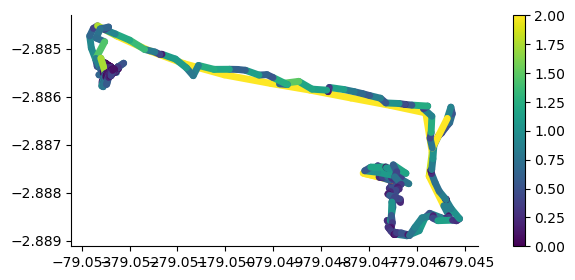

In [94]:
time_generalized = mpd.MinTimeDeltaGeneralizer(original_traj).generalize(tolerance=timedelta(minutes=0.5))
time_generalized.plot(column='speed', vmax=2, **plot_defaults)

In [95]:
time_generalized.to_point_gdf().head(10)


,lat,lon,elevation,trajectory_id,geometry
time,,,,,
2023-04-07 06:54:11,-2.885413,-79.052413,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:41,-2.885400,-79.052418,None,1,POINT (-79.05242 -2.88540)
2023-04-07 06:55:11,-2.885377,-79.052458,None,1,POINT (-79.05246 -2.88538)
2023-04-07 06:55:41,-2.885388,-79.052470,None,1,POINT (-79.05247 -2.88539)
2023-04-07 06:56:11,-2.885400,-79.052478,None,1,POINT (-79.05248 -2.88540)
2023-04-07 06:56:41,-2.885402,-79.052482,None,1,POINT (-79.05248 -2.88540)
2023-04-07 06:57:11,-2.885407,-79.052477,None,1,POINT (-79.05248 -2.88541)
2023-04-07 06:57:41,-2.885398,-79.052457,None,1,POINT (-79.05246 -2.88540)
2023-04-07 06:58:11,-2.885388,-79.052438,None,1,POINT (-79.05244 -2.88539)


In [96]:
original_traj.to_point_gdf().head(10)


,lat,lon,elevation,trajectory_id,geometry
time,,,,,
2023-04-07 06:54:11,-2.885413,-79.052413,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:12,-2.885413,-79.052413,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:13,-2.885412,-79.052413,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:14,-2.885413,-79.052415,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:15,-2.885412,-79.052415,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:16,-2.885410,-79.052415,None,1,POINT (-79.05241 -2.88541)
2023-04-07 06:54:17,-2.885408,-79.052417,None,1,POINT (-79.05242 -2.88541)
2023-04-07 06:54:18,-2.885408,-79.052417,None,1,POINT (-79.05242 -2.88541)
2023-04-07 06:54:19,-2.885403,-79.052422,None,1,POINT (-79.05242 -2.88540)


# Spatiotemporal generalization (TopDownTimeRatioGeneralizer)


In [97]:
tdtr_generalized = mpd.TopDownTimeRatioGeneralizer(original_traj).generalize(tolerance=0.0005)


<Axes: >

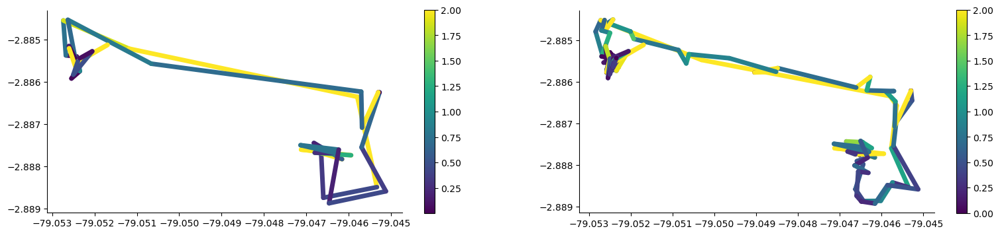

In [98]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(19,4))
tdtr_generalized.plot(ax=axes[0], column='speed', vmax=2, **plot_defaults)
dp_generalized.plot(ax=axes[1], column='speed', vmax=2, **plot_defaults)

## Detecting stops

Based in https://github.com/movingpandas/movingpandas-examples/blob/main/1-tutorials/8-detecting-stops.ipynb


In [99]:
traj_plot = original_traj.hvplot(title='Trajectory {}'.format(original_traj.id), line_width=7.0, tiles='CartoLight', color='slategray') 
traj_plot

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (triangle_angle)

In [100]:
detector = mpd.TrajectoryStopDetector(original_traj)


### Stop duration


In [101]:
%%time
stop_time_ranges = detector.get_stop_time_ranges(min_duration=timedelta(seconds=10), max_diameter=10)

CPU times: user 5.87 s, sys: 2 µs, total: 5.87 s
Wall time: 5.87 s


In [ ]:
length(stop_time_ranges)

### Stop points


In [103]:
%%time
stop_points = detector.get_stop_points(min_duration=timedelta(seconds=10), max_diameter=10)

CPU times: user 8.44 s, sys: 0 ns, total: 8.44 s
Wall time: 8.45 s


In [104]:
stop_points


,geometry,start_time,end_time,traj_id,duration_s
stop_id,,,,,
1_2023-04-07 06:54:11,POINT (-79.05243 -2.88538),2023-04-07 06:54:11,2023-04-07 07:01:28,1,437.0
1_2023-04-07 07:01:29,POINT (-79.05239 -2.88539),2023-04-07 07:01:29,2023-04-07 07:08:58,1,449.0
1_2023-04-07 07:08:59,POINT (-79.05244 -2.88535),2023-04-07 07:08:59,2023-04-07 07:11:00,1,121.0
1_2023-04-07 07:11:01,POINT (-79.05250 -2.88531),2023-04-07 07:11:01,2023-04-07 07:12:06,1,65.0
1_2023-04-07 07:12:07,POINT (-79.05242 -2.88543),2023-04-07 07:12:07,2023-04-07 07:12:48,1,41.0
...,...,...,...,...,...
1_2023-04-07 11:47:02,POINT (-79.05235 -2.88548),2023-04-07 11:47:02,2023-04-07 11:47:26,1,24.0
1_2023-04-07 11:47:31,POINT (-79.05238 -2.88551),2023-04-07 11:47:31,2023-04-07 11:49:40,1,129.0
1_2023-04-07 11:49:49,POINT (-79.05236 -2.88538),2023-04-07 11:49:49,2023-04-07 11:50:04,1,15.0


In [105]:
stop_point_plot = traj_plot * stop_points.hvplot(geo=True, size='duration_s', color='deeppink')
stop_point_plot

:Overlay
   .Tiles.I   :Tiles   [x,y]
   .Path.I    :Path   [Longitude,Latitude]
   .Points.I  :Points   [Longitude,Latitude]   (triangle_angle)
   .Points.II :Points   [Longitude,Latitude]   (duration_s)

### Stop segments


In [113]:
%%time
stops = detector.get_stop_segments(min_duration=timedelta(seconds=10), max_diameter=10)

CPU times: user 9.55 s, sys: 7.98 ms, total: 9.56 s
Wall time: 9.56 s


In [114]:
stops


TrajectoryCollection with 264 trajectories

In [115]:
stop_segment_plot = stop_point_plot * stops.hvplot(line_width=7.0, tiles=None, color='orange') 
stop_segment_plot

:Overlay
   .Tiles.I          :Tiles   [x,y]
   .Path.I           :Path   [Longitude,Latitude]
   .Points.I         :Points   [Longitude,Latitude]   (triangle_angle)
   .Points.II        :Points   [Longitude,Latitude]   (duration_s)
   .Path.II          :Path   [Longitude,Latitude]
   .Points.III       :Points   [Longitude,Latitude]   (triangle_angle)
   .Path.III         :Path   [Longitude,Latitude]
   .Points.IV        :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle)
   .Path.IV          :Path   [Longitude,Latitude]
   .Points.V         :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle)
   .Path.V           :Path   [Longitude,Latitude]
   .Points.VI        :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.VI          :Path   [Longitude,Latitude]
   .Points.VII       :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.VII         :Path   [Longitude,Latitude]
   .Points.VIII      :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.VIII        :Path   [Longitude,Latitude]
   .Points.IX        :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.IX          :Path   [Longitude,Latitude]
   .Points.X         :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.X           :Path   [Longitude,Latitude]
   .Points.XI        :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XI          :Path   [Longitude,Latitude]
   .Points.XII       :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XII         :Path   [Longitude,Latitude]
   .Points.XIII      :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XIII        :Path   [Longitude,Latitude]
   .Points.XIV       :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XIV         :Path   [Longitude,Latitude]
   .Points.XV        :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XV          :Path   [Longitude,Latitude]
   .Points.XVI       :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XVI         :Path   [Longitude,Latitude]
   .Points.XVII      :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XVII        :Path   [Longitude,Latitude]
   .Points.XVIII     :Points   [Longitude,Latitude]   (triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle,triangle_angle)
   .Path.XVIII       :Path   [L

### Split at stops


In [116]:
%%time
split = mpd.StopSplitter(original_traj).split(min_duration=timedelta(seconds=10), max_diameter=10)

CPU times: user 6.01 s, sys: 4 ms, total: 6.01 s
Wall time: 6.02 s


In [117]:
split

TrajectoryCollection with 263 trajectories

In [118]:
split.to_traj_gdf()

,traj_id,start_t,end_t,geometry,length,direction
0,1_2023-04-07 07:01:28,2023-04-07 07:01:28,2023-04-07 07:01:29,"LINESTRING (-79.05240 -2.88537, -79.05240 -2.8...",0.185336,90.000000
1,1_2023-04-07 07:08:58,2023-04-07 07:08:58,2023-04-07 07:08:59,"LINESTRING (-79.05242 -2.88536, -79.05242 -2.8...",0.261396,315.036341
2,1_2023-04-07 07:11:00,2023-04-07 07:11:00,2023-04-07 07:11:01,"LINESTRING (-79.05250 -2.88531, -79.05250 -2.8...",0.185336,270.000000
3,1_2023-04-07 07:12:06,2023-04-07 07:12:06,2023-04-07 07:12:07,"LINESTRING (-79.05245 -2.88537, -79.05245 -2.8...",0.412530,153.457141
4,1_2023-04-07 07:12:48,2023-04-07 07:12:48,2023-04-07 07:12:49,"LINESTRING (-79.05240 -2.88545, -79.05240 -2.8...",0.184332,180.000000
...,...,...,...,...,...,...
258,1_2023-04-07 11:47:01,2023-04-07 11:47:01,2023-04-07 11:47:02,"LINESTRING (-79.05234 -2.88548, -79.05234 -2.8...",0.184332,180.000000
259,1_2023-04-07 11:47:26,2023-04-07 11:47:26,2023-04-07 11:47:31,"LINESTRING (-79.05235 -2.88548, -79.05234 -2.8...",20.688946,270.000000
260,1_2023-04-07 11:49:40,2023-04-07 11:49:40,2023-04-07 11:49:49,"LINESTRING (-79.05239 -2.88553, -79.05240 -2.8...",37.251843,16.124496
261,1_2023-04-07 11:50:04,2023-04-07 11:50:04,2023-04-07 11:50:05,"LINESTRING (-79.05236 -2.88538, -79.05239 -2.8...",19.702660,190.770839


In [ ]:
stop_segment_plot + split.hvplot(title='Trajectory {} split at stops'.format(original_traj.id), line_width=7.0, tiles='CartoLight')